<a href="https://colab.research.google.com/github/Matheshmj/Fake_review_classification_and_topic_modelling/blob/main/Topic__modelling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install pandas scikit-learn numpy matplotlib seaborn
!pip install nltk gensim

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!



LDA Topics:
Topic 1:
small used good im happy dog recommend love great product

Topic 2:
little use screwdriver tool eye driver small problem come screw

Topic 3:
queen green setting gold plate tip look band wheel black

Topic 4:
land like math time spoon swim beach got short treat

Topic 5:
floor like time easy pan cat use box litter clean

Topic 6:
swing want space end team make doctor rack beautiful tree

Topic 7:
compact mm canon shot great good picture gun lens camera

Topic 8:
enjoyed author great love series good character story read book

Topic 9:
day used paint replacement time hole blade unit model saw

Topic 10:
civil time people understand dont average crew oz class war

Topic 11:
shame mile china format far like alarm episode dont season

Topic 12:
leash like chew great harness toy puppy collar love dog

Topic 13:
kid play gift little daughter bought great toy son love

Topic 14:
way kindle protection protector lot protect air ipad screen case

Topic 15:
laptop usb phone 

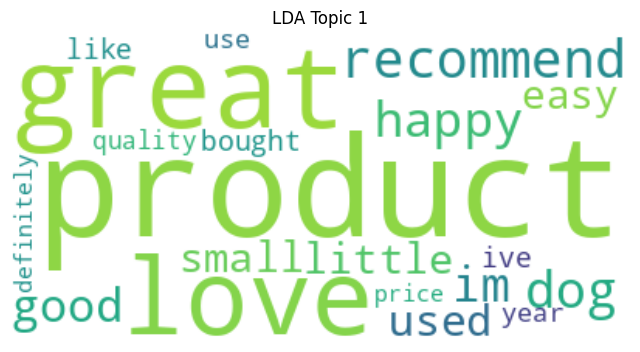

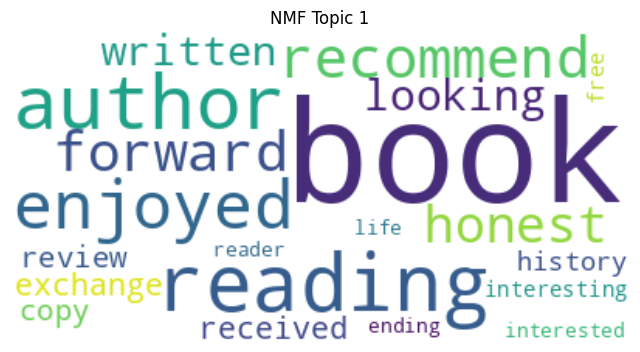

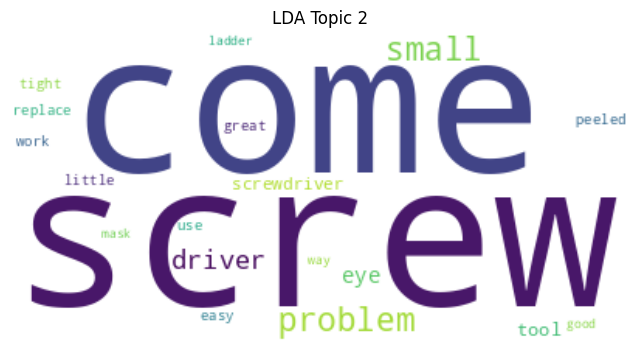

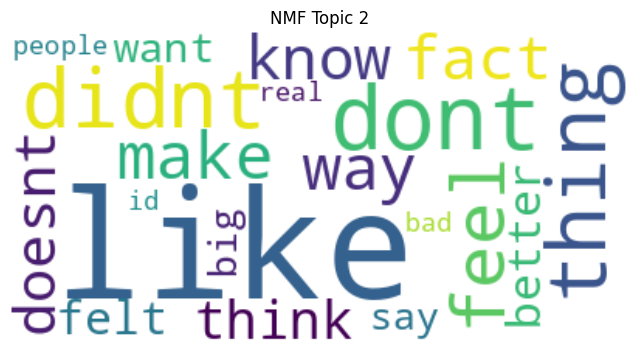

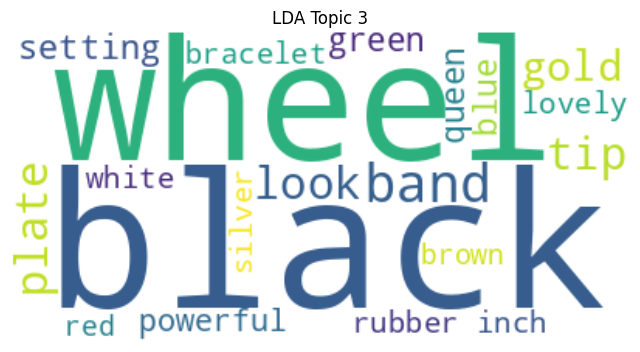

...

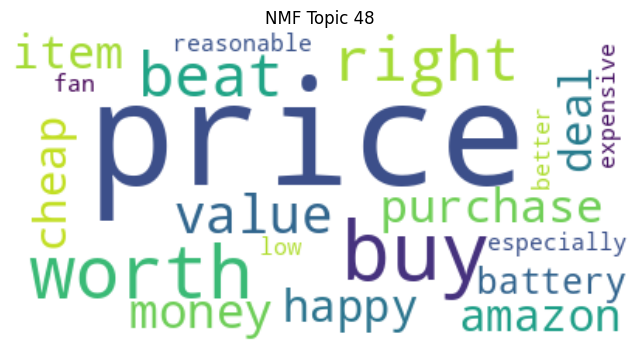

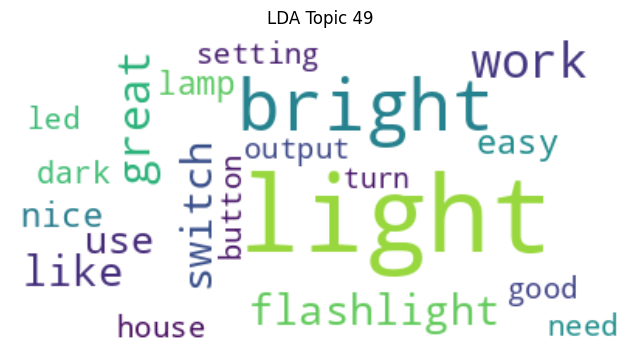

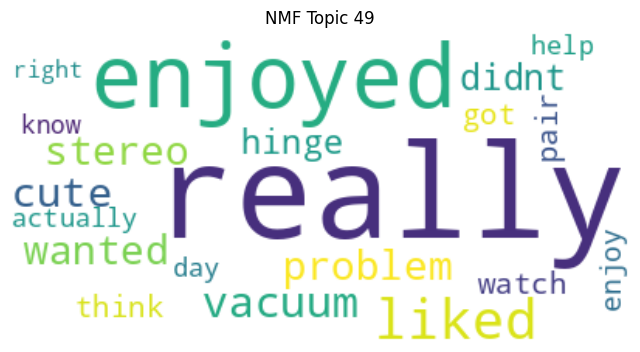

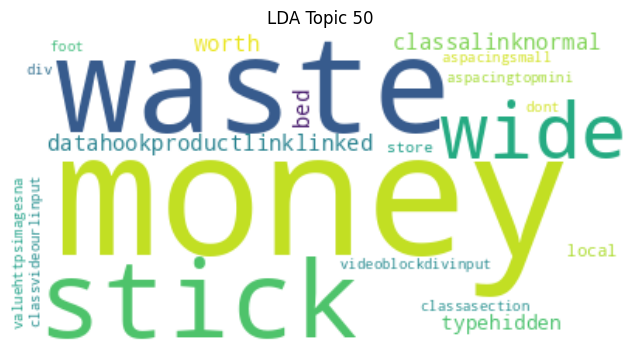

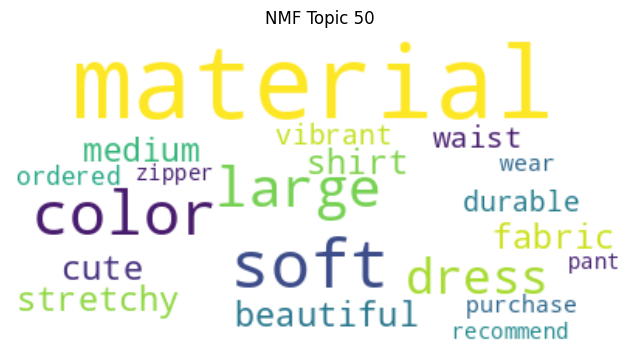

In [5]:
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation, NMF
from nltk.corpus import stopwords
import nltk
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Download NLTK stopwords
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

# Load Dataset
data = pd.read_csv("/content/Downloads_cleaned_review_data.csv")
texts = data['joined_text']  # Ensure 'cleaned_text' is a preprocessed column of text data

# Preprocess Text Data (Remove stopwords, lowercase)
# Preprocess Text Data (Remove stopwords, lowercase)
texts = texts.astype(str).str.lower().str.replace(r'[^\w\s]', '', regex=True)  # Remove punctuation and ensure string type
texts = texts.apply(lambda x: ' '.join([word for word in x.split() if word not in stop_words]))

# Convert Text to Document-Term Matrix
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, stop_words='english')
count_vectorizer = CountVectorizer(max_df=0.95, min_df=2, stop_words='english')

tfidf = tfidf_vectorizer.fit_transform(texts)
count = count_vectorizer.fit_transform(texts)

# Number of Topics
n_topics = 50

# LDA Model
lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
lda.fit(count)

# NMF Model
nmf = NMF(n_components=n_topics, random_state=42)
nmf.fit(tfidf)

# Helper Function to Display Topics
def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print(f"Topic {topic_idx + 1}:")
        print(" ".join([feature_names[i] for i in topic.argsort()[-no_top_words:]]))
        print()

# Display LDA Topics
print("\nLDA Topics:")
display_topics(lda, count_vectorizer.get_feature_names_out(), 10)

# Display NMF Topics
print("\nNMF Topics:")
display_topics(nmf, tfidf_vectorizer.get_feature_names_out(), 10)

# WordCloud for Topics
def plot_wordcloud(model, feature_names, topic_idx, title):
    words = {feature_names[i]: model.components_[topic_idx, i] for i in model.components_[topic_idx].argsort()[-20:]}
    wordcloud = WordCloud(background_color="white").generate_from_frequencies(words)
    plt.figure(figsize=(8, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(title)
    plt.show()

# Plot WordCloud for Each Topic
for i in range(n_topics):
    plot_wordcloud(lda, count_vectorizer.get_feature_names_out(), i, f"LDA Topic {i + 1}")
    plot_wordcloud(nmf, tfidf_vectorizer.get_feature_names_out(), i, f"NMF Topic {i + 1}")
